** Diffusion Models are Evolutionary Algorithms**

The goal of the project is to study an evolutionary algorithm inspired by the analogy related to DDIM (https://arxiv.org/pdf/2410.02543) for solving simple optimization problems (benchmarks: Rosenbrock, Beale, Himmelblau, Ackley, Rastrigin).

# Imports

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from torch.distributions import MultivariateNormal
from torch.distributions.multivariate_normal import MultivariateNormal

# Implementation of the algorithm, alpha scheduler & density mappings

In [ ]:
import torch

def next_population(x, fitness, alpha, noise=1.0):
    alpha_curr, alpha_prev = alpha

    def estimate_x0(x_t, eps=1e-10):
        mu = x * (alpha_curr ** 0.5)
        sigma = (1 - alpha_curr)
        p_diffusion = torch.exp(-(torch.norm(x_t - mu, dim=-1) ** 2) / (2 * sigma))

        prob = (fitness + eps) * (p_diffusion + eps)
        z = torch.sum(prob)
        x0_estimate = torch.sum(prob.unsqueeze(1) * x, dim=0) / (z + eps)

        return x0_estimate

    x0_estimates = torch.vmap(estimate_x0)(x)

    sigma = ((1 - alpha_prev) / (1 - alpha_curr)
             * (1 - alpha_curr / alpha_prev)) ** 0.5 * noise
    eps = (x - (alpha_curr ** 0.5) * x0_estimates) / (1.0 - alpha_curr) ** 0.5
    x_next = (
        (alpha_prev ** 0.5) * x0_estimates
        + ((1 - alpha_prev - sigma ** 2) ** 0.5) * eps
        + sigma * torch.randn_like(x0_estimates)
    )

    return x_next, x0_estimates


class Alpha_Schedule:
    def __init__(self, num_step):
        alpha = torch.cos(torch.linspace(0, torch.pi, num_step)) + 1
        self.alpha = (alpha / 2 + 1e-3) * (1 - 1e-3) / (1 + 1e-3)
        self.num_step = num_step
        self.index = 0

    def __next__(self):
        if self.index >= self.num_step - 1:
            raise StopIteration
        t = self.num_step - self.index - 1
        alpha = self.alpha[t]
        alpha_past = self.alpha[t - 1]
        self.index += 1
        return t, (alpha, alpha_past)

    def __len__(self):
        return self.num_step - 1

    def __iter__(self):
        self.index = 0
        return self




class Identity_mapping:
    def __init__(self, l2_factor=0.0):
        self.l2_factor = l2_factor

    def __call__(self, x):
        l2_penalty = torch.norm(x, dim=-1) ** 2 * self.l2_factor
        return x * torch.exp(-l2_penalty)


class Power_mapping:
    def __init__(self, power=1.0, temperature=1.0):
        self.power = power
        self.temperature = temperature

    def __call__(self, x):
        return (x / self.temperature) ** self.power


##Two-peak density

The "Two-peak density" test from the original paper (Appendix A.1) - we check whether a random population, after 100 steps of evolution (aka reverse diffusion), converges to a distribution with two Gaussian modes at (1,1) and (-1,-1).

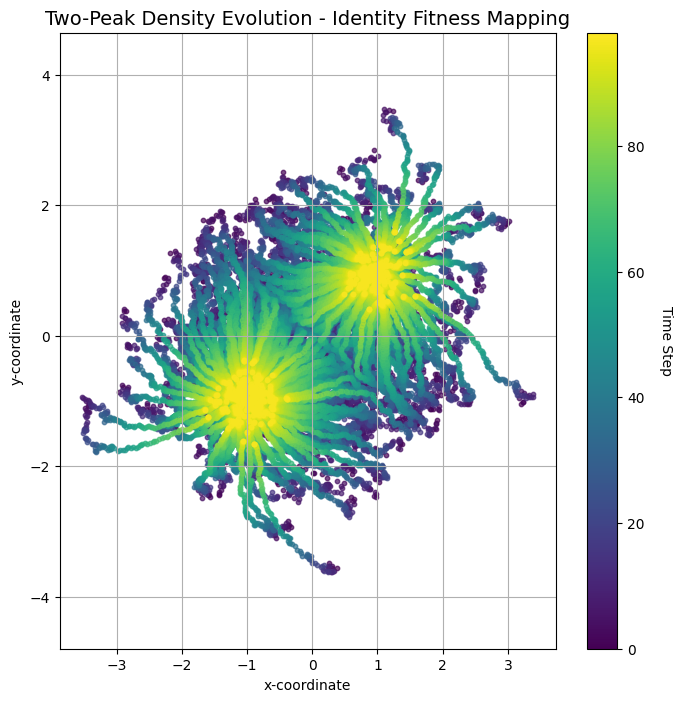

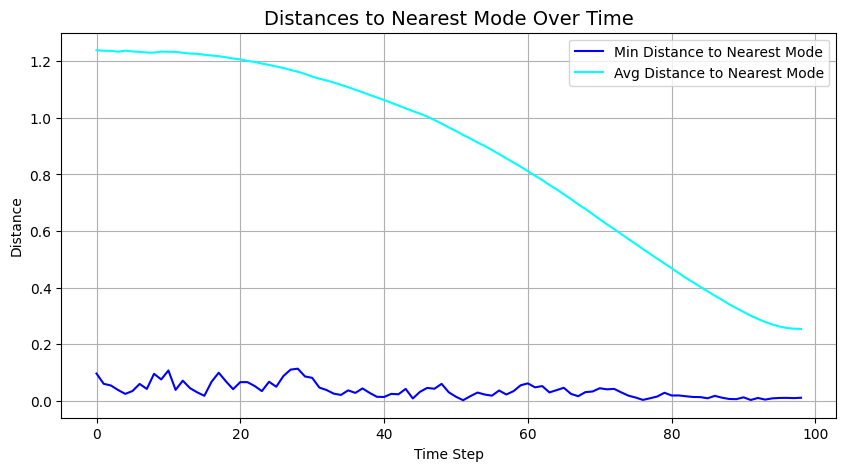

In [ ]:
scheduler = Alpha_Schedule(num_step=100)
population = torch.randn(512, 2)
evolution_trace = []
fitness_mapping = Identity_mapping()

distances_to_nearest_mode = []

target_1 = torch.tensor([1.0, 1.0])
target_2 = torch.tensor([-1.0, -1.0])

def two_peak_density(x, std=0.1):
    mu1 = torch.tensor([-1., -1.])
    mu2 = torch.tensor([1., 1.])
    covariance_matrix = torch.eye(2) * (std ** 2)

    dist1 = MultivariateNormal(mu1, covariance_matrix)
    dist2 = MultivariateNormal(mu2, covariance_matrix)

    density = dist1.log_prob(x).exp() + dist2.log_prob(x).exp()

    return density

for time_step, alpha in scheduler:
    fitness_scores = two_peak_density(population, std=0.25)
    population, _ = next_population(population, fitness_mapping(fitness_scores), alpha, noise=0.1)
    evolution_trace.append(population)

    distances_to_mode1 = torch.norm(population - target_1, dim=1)
    distances_to_mode2 = torch.norm(population - target_2, dim=1)
    distances_to_nearest = torch.min(distances_to_mode1, distances_to_mode2)

    min_distance = distances_to_nearest.min().item()
    avg_distance = distances_to_nearest.mean().item()
    distances_to_nearest_mode.append((min_distance, avg_distance))

evolution_trace = torch.stack(evolution_trace)

cmap = plt.get_cmap("viridis")
plt.figure(figsize=(8, 8))

for i, population_at_time in enumerate(evolution_trace):
    color_intensity = i / len(evolution_trace)
    x, y = population_at_time[:, 0], population_at_time[:, 1]
    plt.scatter(x, y, color=cmap(color_intensity), alpha=0.7, s=10)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=len(evolution_trace)-1))
sm.set_array([])
cbar = plt.colorbar(sm, ax=plt.gca())
cbar.set_label("Time Step", rotation=270, labelpad=20)

plt.title("Two-Peak Density Evolution - Identity Fitness Mapping", fontsize=14)
plt.xlabel("x-coordinate")
plt.ylabel("y-coordinate")
plt.grid(True)
plt.axis('equal')
plt.show()

min_distances, avg_distances = zip(*distances_to_nearest_mode)

plt.figure(figsize=(10, 5))
plt.plot(min_distances, label="Min Distance to Nearest Mode", color="blue")
plt.plot(avg_distances, label="Avg Distance to Nearest Mode", color="cyan")
plt.title("Distances to Nearest Mode Over Time", fontsize=14)
plt.xlabel("Time Step")
plt.ylabel("Distance")
plt.legend()
plt.grid(True)
plt.show()


We observe the evolution process, noting the decreasing mean and minimum distance to the nearest mode of the distribution over time. As demonstrated below, applying a power function to map the original two-peak density accelerates convergence and improves the final population's quality.

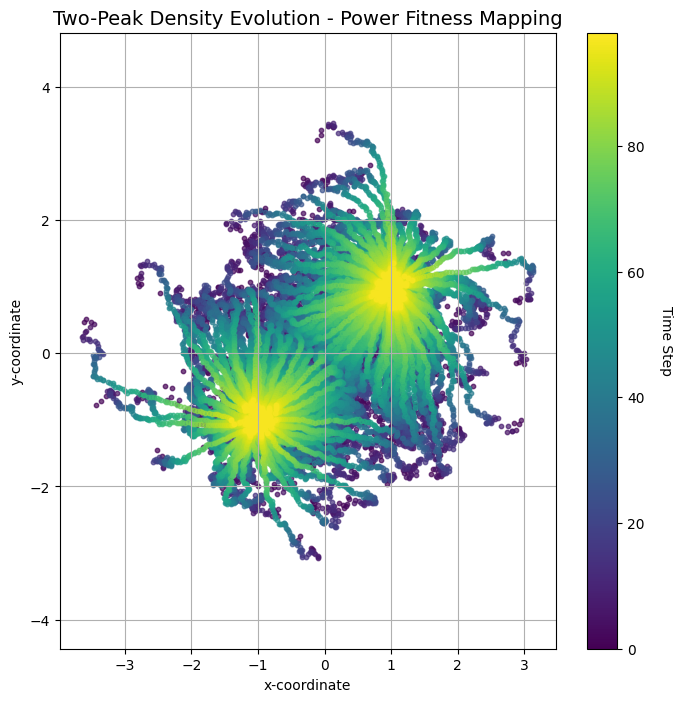

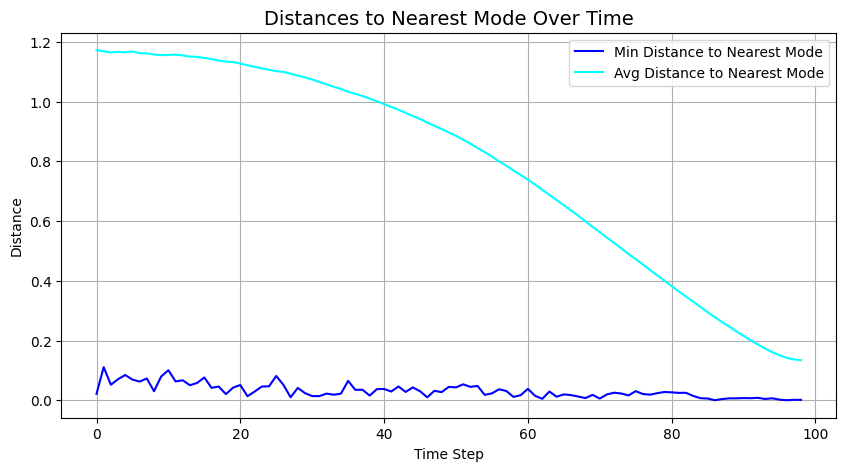

In [ ]:
scheduler = Alpha_Schedule(num_step=100)
population = torch.randn(512, 2)
evolution_trace = []
fitness_mapping = Power_mapping(3)

distances_to_nearest_mode = []

target_1 = torch.tensor([1.0, 1.0])
target_2 = torch.tensor([-1.0, -1.0])

def two_peak_density(x, std=0.1):
    mu1 = torch.tensor([-1., -1.])
    mu2 = torch.tensor([1., 1.])
    covariance_matrix = torch.eye(2) * (std ** 2)

    dist1 = MultivariateNormal(mu1, covariance_matrix)
    dist2 = MultivariateNormal(mu2, covariance_matrix)

    density = dist1.log_prob(x).exp() + dist2.log_prob(x).exp()

    return density

for time_step, alpha in scheduler:
    fitness_scores = two_peak_density(population, std=0.25)
    population, _ = next_population(population, fitness_mapping(fitness_scores), alpha, noise=0.1)
    evolution_trace.append(population)

    distances_to_mode1 = torch.norm(population - target_1, dim=1)
    distances_to_mode2 = torch.norm(population - target_2, dim=1)
    distances_to_nearest = torch.min(distances_to_mode1, distances_to_mode2)

    min_distance = distances_to_nearest.min().item()
    avg_distance = distances_to_nearest.mean().item()
    distances_to_nearest_mode.append((min_distance, avg_distance))

evolution_trace = torch.stack(evolution_trace)

cmap = plt.get_cmap("viridis")
plt.figure(figsize=(8, 8))

for i, population_at_time in enumerate(evolution_trace):
    color_intensity = i / len(evolution_trace)
    x, y = population_at_time[:, 0], population_at_time[:, 1]
    plt.scatter(x, y, color=cmap(color_intensity), alpha=0.7, s=10)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=len(evolution_trace)-1))
sm.set_array([])
cbar = plt.colorbar(sm, ax=plt.gca())
cbar.set_label("Time Step", rotation=270, labelpad=20)

plt.title("Two-Peak Density Evolution - Power Fitness Mapping", fontsize=14)
plt.xlabel("x-coordinate")
plt.ylabel("y-coordinate")
plt.grid(True)
plt.axis('equal')
plt.show()

min_distances, avg_distances = zip(*distances_to_nearest_mode)

plt.figure(figsize=(10, 5))
plt.plot(min_distances, label="Min Distance to Nearest Mode", color="blue")
plt.plot(avg_distances, label="Avg Distance to Nearest Mode", color="cyan")
plt.title("Distances to Nearest Mode Over Time", fontsize=14)
plt.xlabel("Time Step")
plt.ylabel("Distance")
plt.legend()
plt.grid(True)
plt.show()


Final Average Distance after 2 Diffusion Steps: 1.1647357940673828
Final Average Distance after 3 Diffusion Steps: 0.5967544317245483
Final Average Distance after 4 Diffusion Steps: 0.3930923640727997
Final Average Distance after 5 Diffusion Steps: 0.27179473638534546
Final Average Distance after 10 Diffusion Steps: 0.23197877407073975
Final Average Distance after 20 Diffusion Steps: 0.23245999217033386
Final Average Distance after 30 Diffusion Steps: 0.25960877537727356
Final Average Distance after 40 Diffusion Steps: 0.24899056553840637
Final Average Distance after 50 Diffusion Steps: 0.2467881143093109
Final Average Distance after 60 Diffusion Steps: 0.2517502009868622
Final Average Distance after 70 Diffusion Steps: 0.2589498460292816
Final Average Distance after 80 Diffusion Steps: 0.26304978132247925
Final Average Distance after 90 Diffusion Steps: 0.2662154734134674


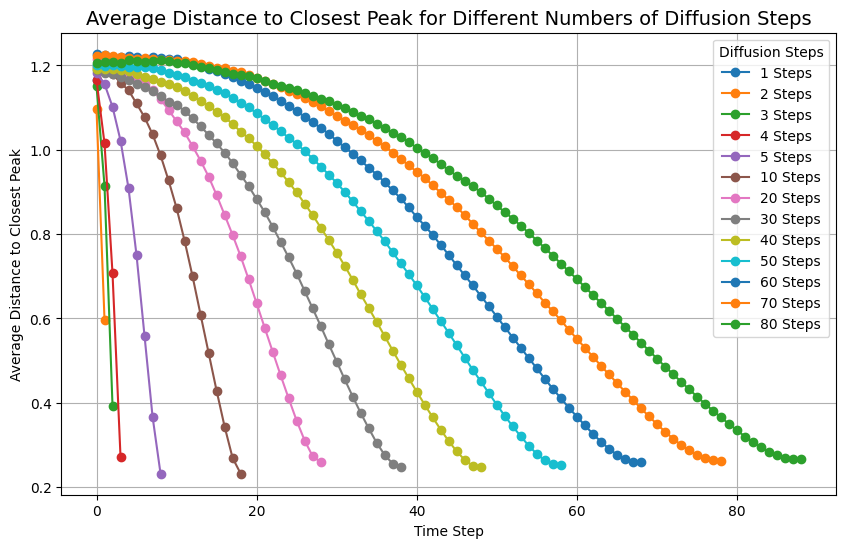

In [ ]:
target_1 = torch.tensor([1.0, 1.0])
target_2 = torch.tensor([-1.0, -1.0])
diffusion_steps = [i for i in range(1,6)] + [10*i for i in range(1,10)]
avg_distances_all_steps = []

for num_steps in diffusion_steps:
    scheduler = Alpha_Schedule(num_step=num_steps)
    population = torch.randn(512, 2)
    avg_distances = []

    for time_step, alpha in scheduler:
        fitness_scores = two_peak_density(population, std=0.25)
        population, _ = next_population(population, Identity_mapping()(fitness_scores), alpha, noise=0.1)

        distances_to_mode1 = torch.norm(population - target_1, dim=1)
        distances_to_mode2 = torch.norm(population - target_2, dim=1)
        closest_distances = torch.min(distances_to_mode1, distances_to_mode2)

        avg_distance = closest_distances.mean().item()
        avg_distances.append(avg_distance)

    if avg_distances:
        avg_distances_all_steps.append(avg_distances)
        print(f"Final Average Distance after {num_steps} Diffusion Steps: {avg_distances[-1]}")

plt.figure(figsize=(10, 6))

for i, num_steps in enumerate(diffusion_steps):
    if i < len(avg_distances_all_steps) and avg_distances_all_steps[i]:
        plt.plot(avg_distances_all_steps[i], label=f'{num_steps} Steps', marker='o')

plt.title("Average Distance to Closest Peak for Different Numbers of Diffusion Steps", fontsize=14)
plt.xlabel("Time Step")
plt.ylabel("Average Distance to Closest Peak")
plt.legend(title="Diffusion Steps")
plt.grid(True)
plt.show()

We can observe that increasing the number of diffusion steps does not always lead to improvements in the evolution process. Satisfactory results can already be achieved with ≤10 steps, and the optimal number does not exceed 100.

Similar test for multiple-peak density (Gaussian Mixture with four modes)

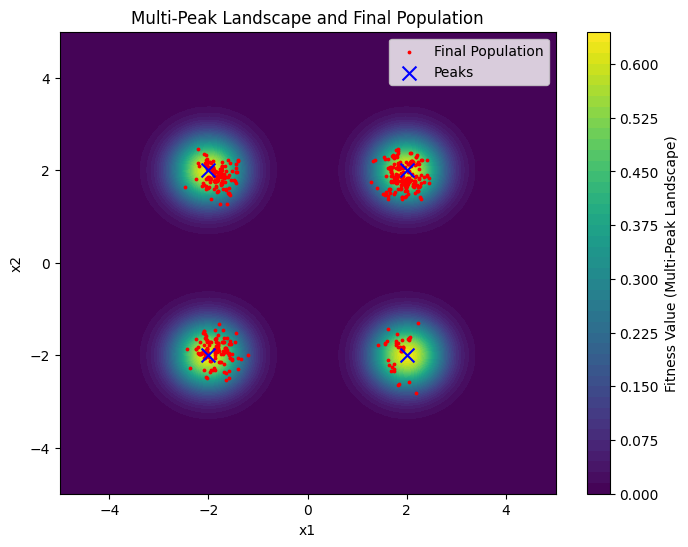

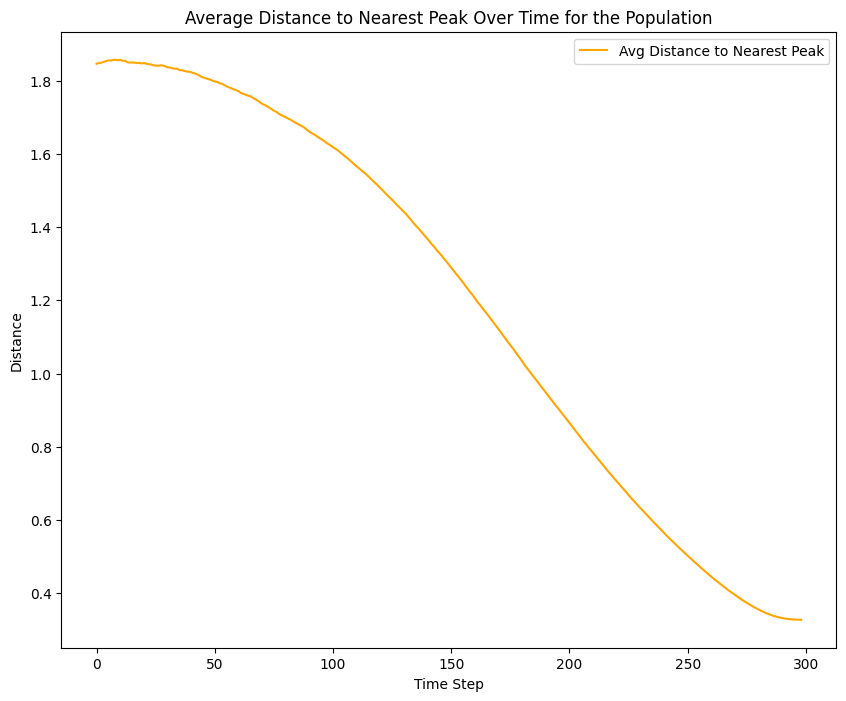

In [ ]:
std_dev = 0.5

def create_multi_peak_density(x, std_dev=std_dev):
    fitness_values = torch.zeros(x.shape[0])
    peak_positions = torch.tensor([[2.0, 2.0], [2.0, -2.0], [-2.0, 2.0], [-2.0, -2.0]])
    covariance_matrix = torch.eye(x.shape[1]) * (std_dev ** 2)

    for peak in peak_positions:
        distribution = MultivariateNormal(peak, covariance_matrix)
        density_values = distribution.log_prob(x).exp()
        fitness_values += density_values

    return fitness_values

def compute_distances(population, peak_positions):
    distances = torch.cdist(population, peak_positions)
    min_distances = distances.min(dim=1).values
    return min_distances

density_scheduler = Alpha_Schedule(num_step=300)

population = torch.randn(512, 2)
population_trace = []
fitness_mapping_fn = Power_mapping(3)

avg_distances_over_time = []

peak_positions = torch.tensor([[2.0, 2.0], [2.0, -2.0], [-2.0, 2.0], [-2.0, -2.0]])

for time_step, alpha_value in density_scheduler:
    fitness_values = create_multi_peak_density(population, std_dev=std_dev)
    mapped_fitness_values = fitness_mapping_fn(fitness_values)
    population, _ = next_population(population, mapped_fitness_values, alpha_value, noise=0.1)
    population_trace.append(population)

    min_distances = compute_distances(population, peak_positions)

    avg_distances_over_time.append(min_distances.mean().item())

population_trace = torch.stack(population_trace)


x_coords = np.linspace(-5, 5, 100)
y_coords = np.linspace(-5, 5, 100)

X_grid, Y_grid = np.meshgrid(x_coords, y_coords)
fitness_grid = np.zeros_like(X_grid)

for i in range(X_grid.shape[0]):
    for j in range(X_grid.shape[1]):
        fitness_grid[i, j] = create_multi_peak_density(torch.tensor([[X_grid[i, j], Y_grid[i, j]]]), std_dev=std_dev).item()

plt.figure(figsize=(8, 6))
plt.contourf(X_grid, Y_grid, fitness_grid, levels=50, cmap='viridis')
plt.colorbar(label="Fitness Value (Multi-Peak Landscape)")

final_population = population_trace[-1].numpy()
plt.scatter(final_population[:, 0], final_population[:, 1], color='r', label='Final Population', s=3)
plt.scatter(peak_positions[:, 0], peak_positions[:, 1], color='b', label='Peaks', s=100, marker='x')

plt.title('Multi-Peak Landscape and Final Population')
plt.xlabel('x1')
plt.ylabel('x2')
plt.legend()

plt.show()


plt.figure(figsize=(10, 8))
plt.plot(avg_distances_over_time, label='Avg Distance to Nearest Peak',  color='orange')

plt.xlabel('Time Step')
plt.ylabel('Distance')
plt.title('Average Distance to Nearest Peak Over Time for the Population')
plt.legend()
plt.show()


The algorithm finds diverse solutions. Although the final population is not evenly distributed across all modes of the considered distribution, it still maintains diversity.

# Benchmarks

In [ ]:
def rosenbrock(x):
    x1, x2 = x[:, 0], x[:, 1]
    return 100 * (x2 - x1**2)**2 + (1 - x1)**2

def beale(x):
    x1, x2 = x[:, 0], x[:, 1]
    return ((1.5 - x1 + x1 * x2)**2 +
            (2.25 - x1 + x1 * x2**2)**2 +
            (2.625 - x1 + x1 * x2**3)**2)

def himmelblau(x):
    x1, x2 = x[:, 0], x[:, 1]
    return (x1**2 + x2 - 11)**2 + (x1 + x2**2 - 7)**2

def ackley(x, a=20, b=0.2, c=2 * np.pi):
    x1, x2 = x[:, 0], x[:, 1]
    term1 = -a * torch.exp(-b * torch.sqrt(0.5 * (x1**2 + x2**2)))
    term2 = -torch.exp(0.5 * (torch.cos(c * x1) + torch.cos(c * x2)))
    return term1 + term2 + a + torch.exp(torch.tensor(1.0))

def rastrigin(x, A=10):
    x1, x2 = x[:, 0], x[:, 1]
    return -(A * 2 + (x1**2 - A * torch.cos(2 * np.pi * x1)) + (x2**2 - A * torch.cos(2 * np.pi * x2)))

def transformed_fitness(f, x, f_star, s, eps=10**(-3)):
    f_val = f(x)
    return eps / (eps + ((f_val - f_star)**2 / s**2))

def evaluate_function_on_grid(func, f_star, s, xlim=(-4, 4), ylim=(-4, 4), resolution=200):
    x_vals = np.linspace(xlim[0], xlim[1], resolution)
    y_vals = np.linspace(ylim[0], ylim[1], resolution)
    X, Y = np.meshgrid(x_vals, y_vals)
    Z = np.zeros_like(X)

    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            x = torch.tensor([[X[i, j], Y[i, j]]], dtype=torch.float32)
            Z[i, j] = transformed_fitness(func, x, f_star, s).item()

    return X, Y, Z

100%|██████████| 19/19 [00:00<00:00, 337.25it/s]


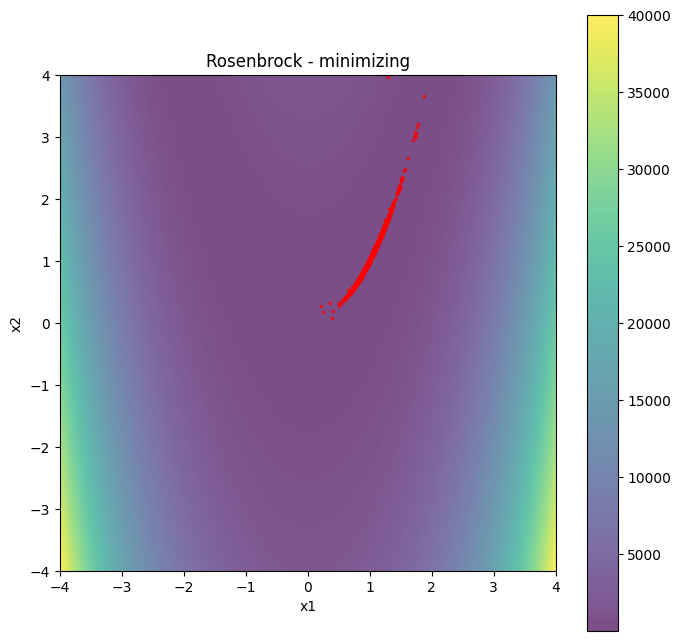

100%|██████████| 19/19 [00:00<00:00, 425.79it/s]


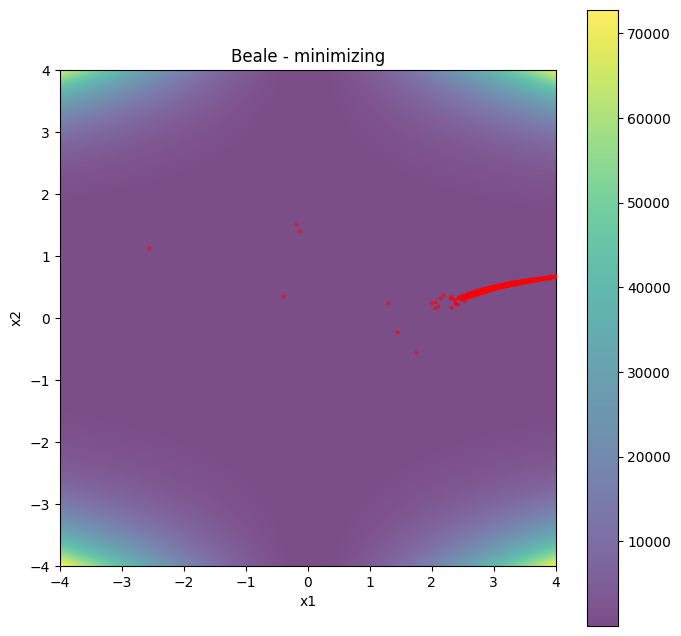

100%|██████████| 19/19 [00:00<00:00, 270.41it/s]


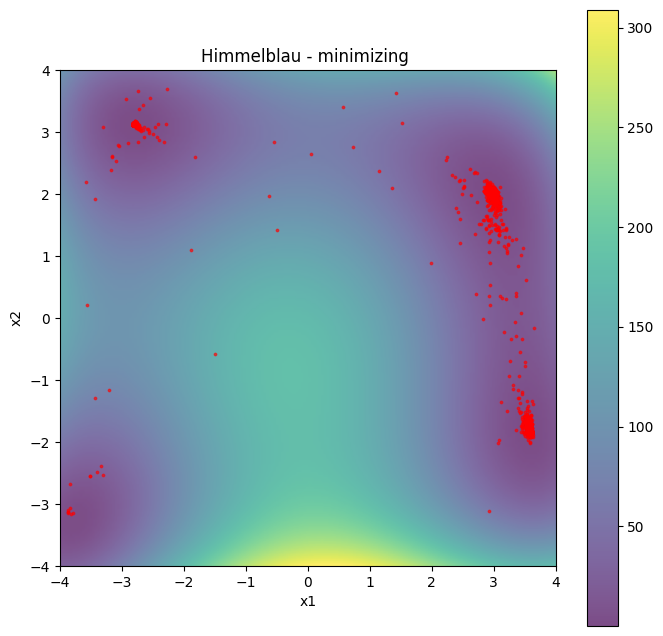

100%|██████████| 19/19 [00:00<00:00, 326.98it/s]


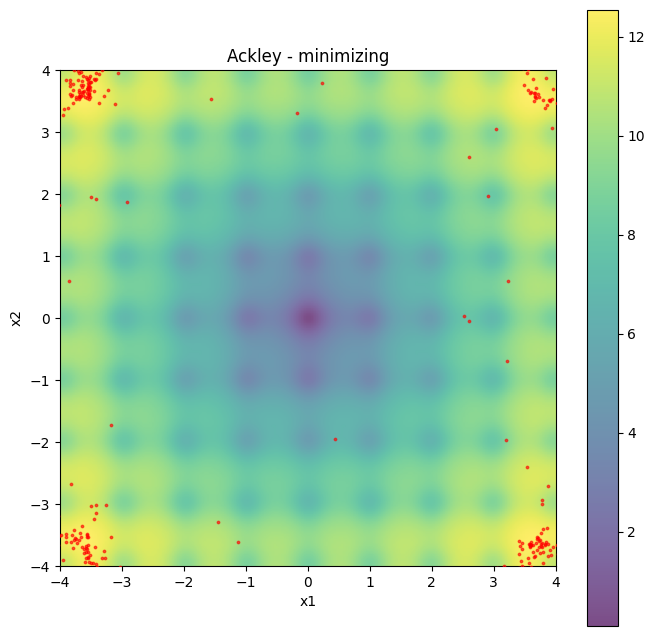

100%|██████████| 19/19 [00:00<00:00, 287.87it/s]


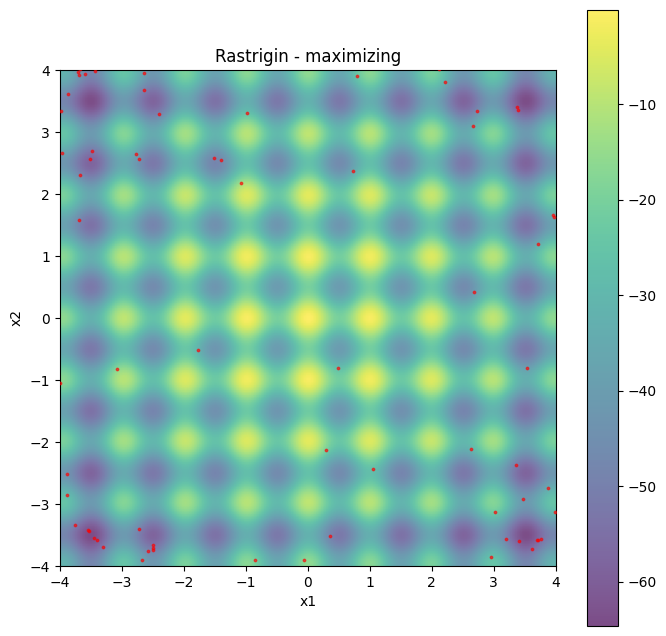

In [ ]:
def evaluate_function_on_grid(func, xlim=(-4, 4), ylim=(-4, 4), resolution=200):
    x_vals = np.linspace(xlim[0], xlim[1], resolution)
    y_vals = np.linspace(ylim[0], ylim[1], resolution)
    X, Y = np.meshgrid(x_vals, y_vals)
    Z = np.zeros_like(X)

    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            x = torch.tensor([[X[i, j], Y[i, j]]], dtype=torch.float32)
            Z[i, j] = func(x).item()

    return X, Y, Z

def plot_density_and_trajectory(func, trace, x0_trace, title, ax):
    colormap = plt.cm.binary
    norm = plt.Normalize(vmin=0, vmax=len(trace)-1)

    x0 = x0_trace[-1]
    ax.scatter(x0[:, 0], x0[:, 1], color='red', marker='o', s=3, zorder=10, alpha=0.6, label="Final x_0 estimates")

def optimize_and_visualize(func, f_star, s, title):
    scheduler = Alpha_Schedule(num_step=20)
    scaling = 4.0
    noise = 0.1
    fig, ax = plt.subplots(figsize=(8, 8))

    def wrapped_func(x):
        return transformed_fitness(func, x, f_star, s)

    X, Y, Z = evaluate_function_on_grid(func)
    im = ax.imshow(Z, extent=(-4, 4, -4, 4), origin="lower", cmap="viridis", alpha=0.7)
    ax.set_xlim(-4, 4)
    ax.set_ylim(-4, 4)
    ax.set_title(title)
    ax.set_xlabel("x1")
    ax.set_ylabel("x2")

    plt.colorbar(im, ax=ax)

    for i in range(10):
        x = torch.randn(216, 2)
        trace, x0_trace = [], []

        for t, alpha in tqdm(scheduler, total=scheduler.num_step - 1):
            fitness = wrapped_func(x * scaling)
            x, x0 = next_population(x, fitness, alpha, noise=noise)
            trace.append(x.clone() * scaling)
            x0_trace.append(x0.clone() * scaling)

        trace = torch.stack(trace)
        x0_trace = torch.stack(x0_trace)

        plot_density_and_trajectory(func, trace, x0_trace, title, ax)
    plt.show()

if __name__ == "__main__":
    val_ack = ackley(torch.tensor([[4.0, 4.0]]))
    val_rast = rastrigin(torch.tensor([[4.0, 4.0]]))

    functions = [
        ("Rosenbrock - minimizing", rosenbrock, 0, 1),
        ("Beale - minimizing", beale, 0, 1),
        ("Himmelblau - minimizing ", himmelblau, 0, 1),
        ("Ackley - minimizing", ackley, 12.5401, 2),
       ("Rastrigin - maximizing", rastrigin, -64.6249, 30)
    ]

for name, func, f_star, s in functions:
        optimize_and_visualize(func, f_star, s, title=name)


Plots above show final x_0 estimates (red) and the backround is original benchmark function.

100%|██████████| 149/149 [00:06<00:00, 24.18it/s]


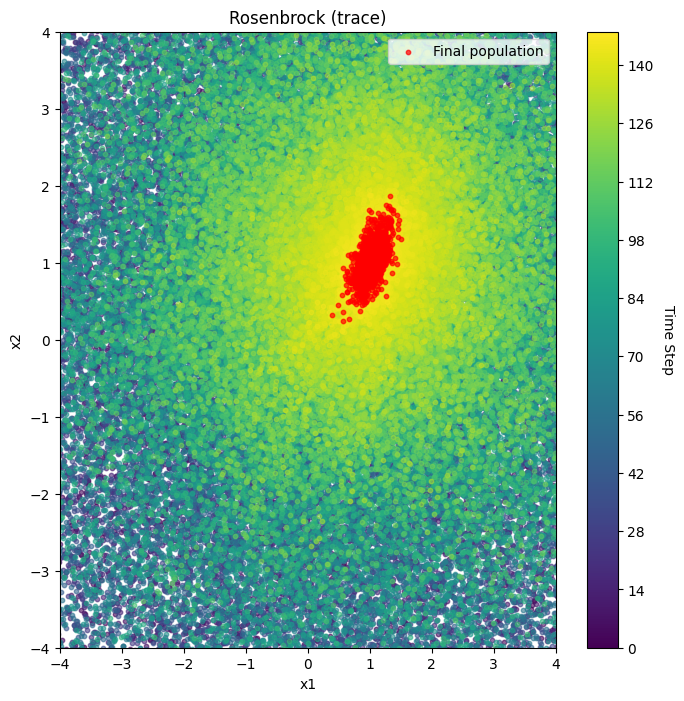

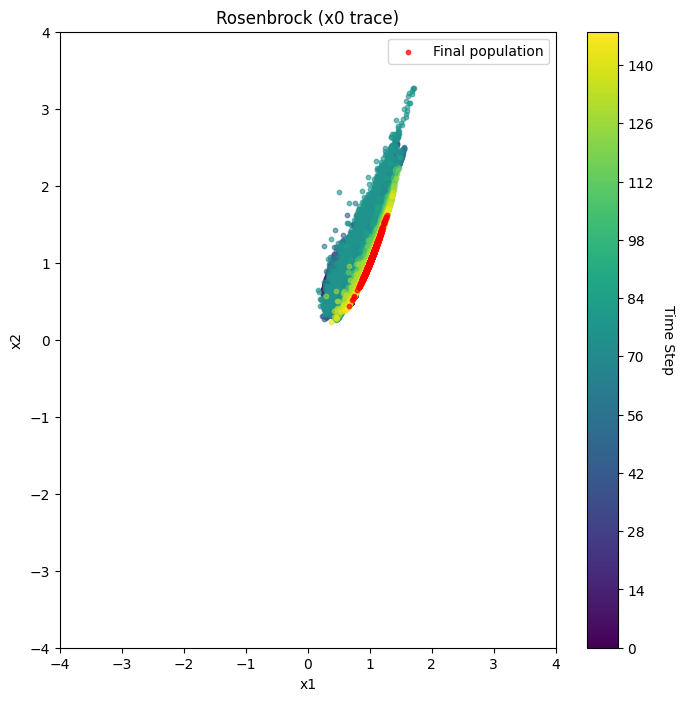

100%|██████████| 149/149 [00:06<00:00, 24.08it/s]


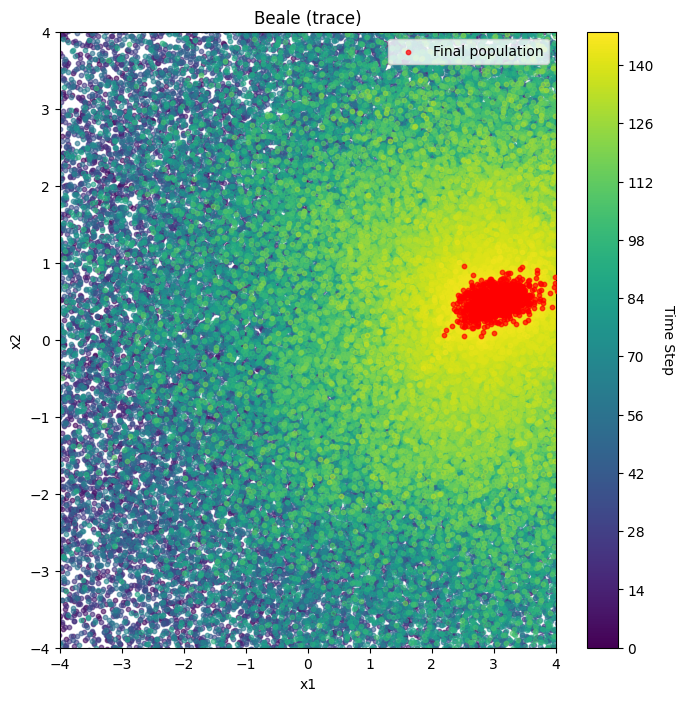

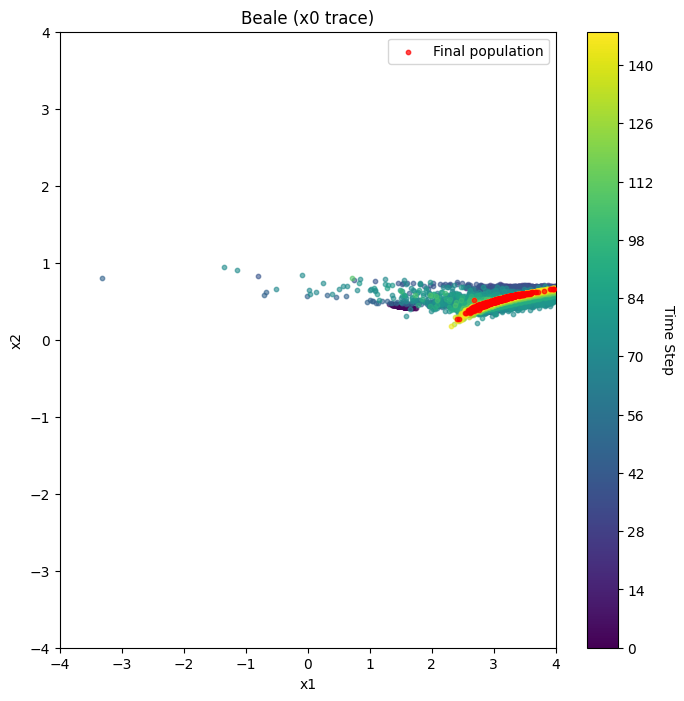

100%|██████████| 149/149 [00:05<00:00, 25.77it/s]


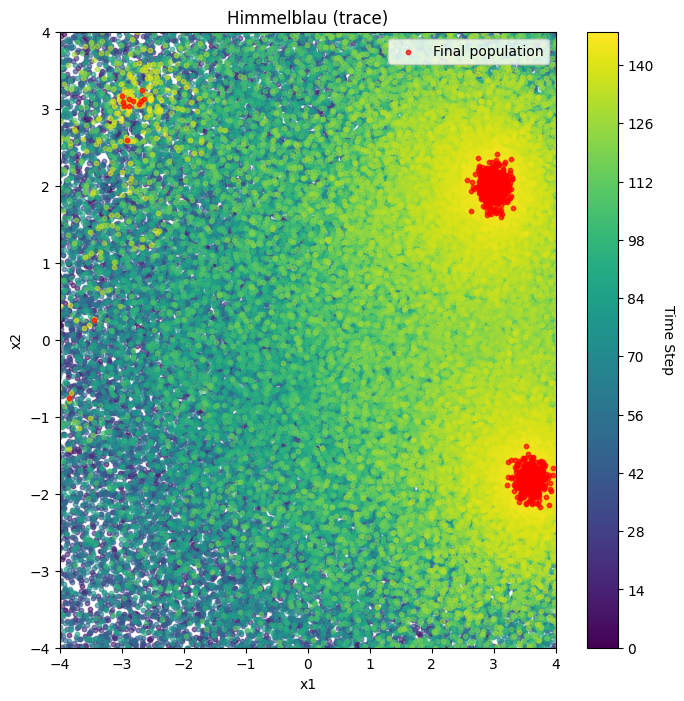

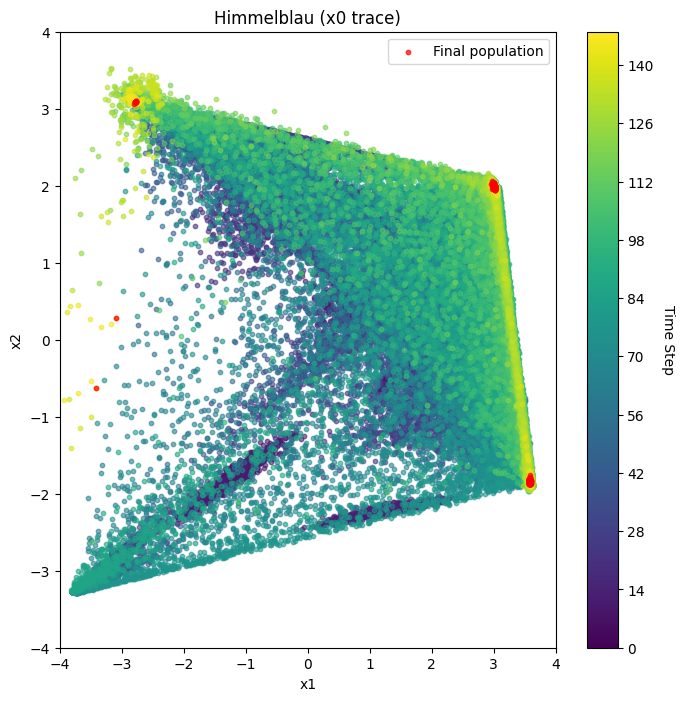

100%|██████████| 149/149 [00:06<00:00, 22.54it/s]


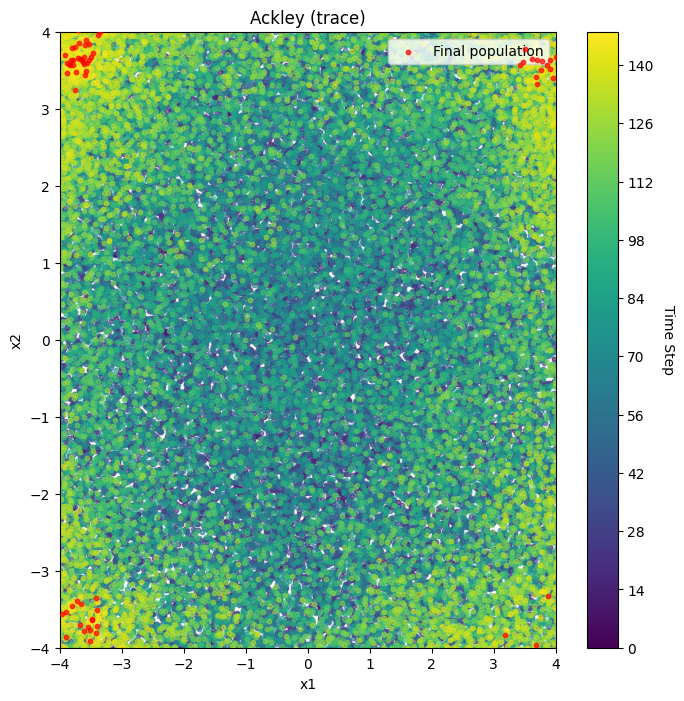

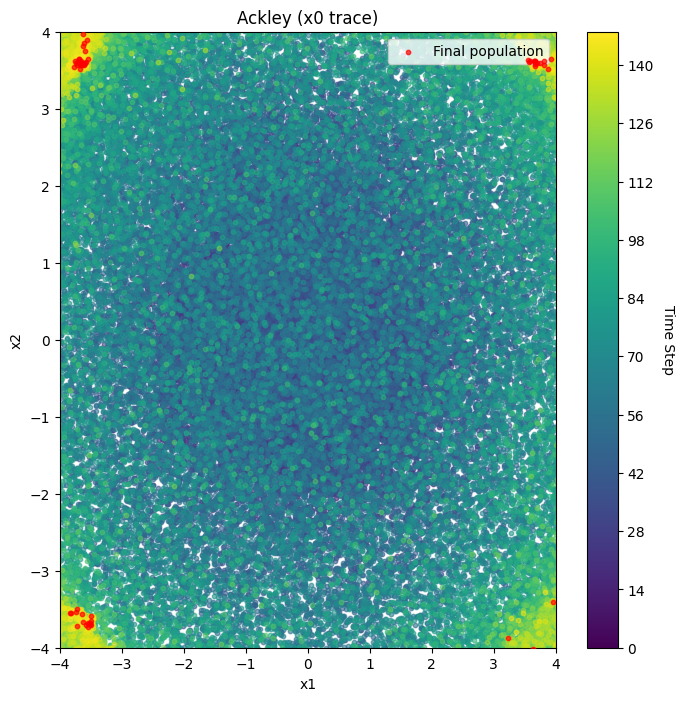

100%|██████████| 149/149 [00:08<00:00, 17.19it/s]


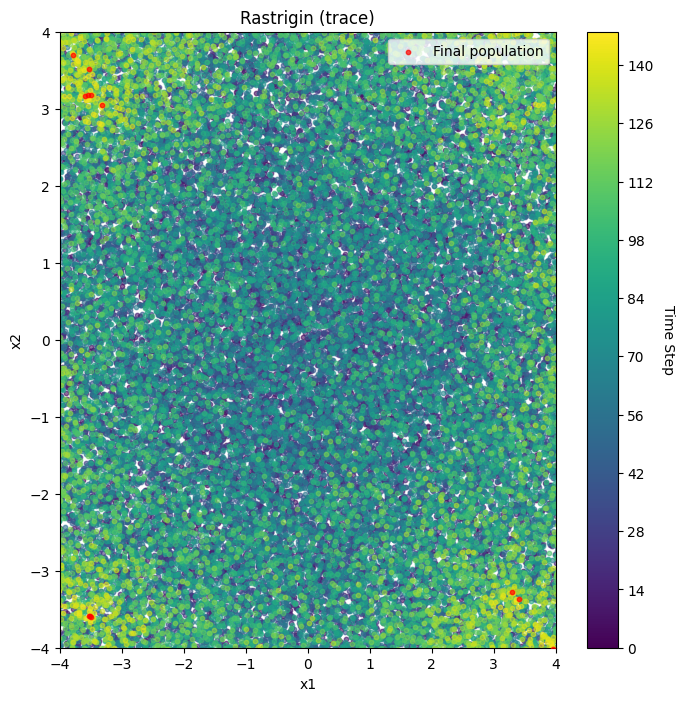

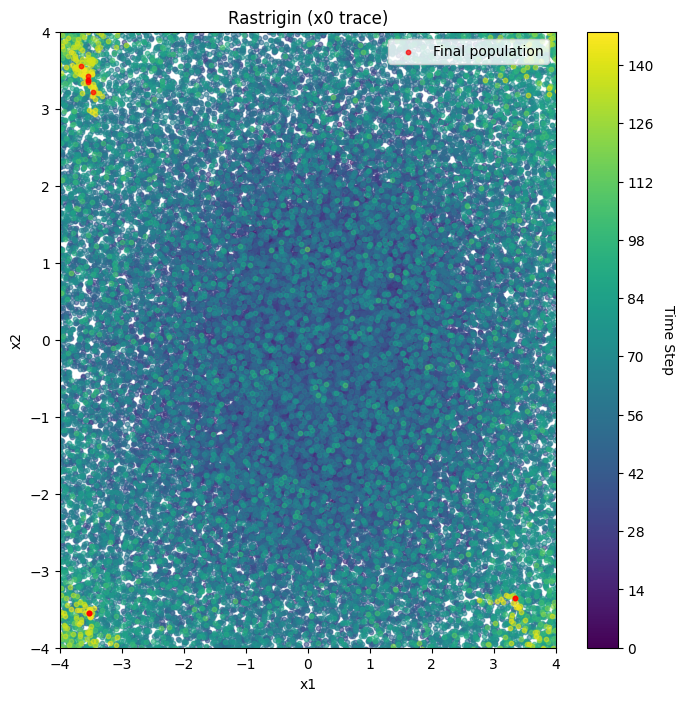

In [ ]:
def plot_density_and_trajectory(func, trace, f_star, s, title, ax, is_trace=True):
    ax.set_xlim(-4, 4)
    ax.set_ylim(-4, 4)

    final_color = 'red'
    x = trace[-1]
    ax.scatter(x[:, 0], x[:, 1], color=final_color, marker='o', s=10, zorder=10, alpha=0.7, label="Final population")

    for i, population_at_time in enumerate(trace):
        color_intensity = i / len(trace)
        ax.scatter(population_at_time[:, 0].numpy(), population_at_time[:, 1].numpy(),
                   color=plt.cm.viridis(color_intensity), alpha=0.6, s=10)

    ax.set_title(title)
    ax.set_xlabel("x1")
    ax.set_ylabel("x2")
    ax.legend(loc="upper right", fontsize=10, frameon=True)

    sm = plt.cm.ScalarMappable(cmap="viridis", norm=plt.Normalize(vmin=0, vmax=len(trace)-1))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, orientation="vertical")
    cbar.set_label("Time Step", rotation=270, labelpad=15)

    cbar.set_ticks(np.arange(0, len(trace), max(1, len(trace)//10)))

    ax.set_facecolor("white")


def plot_density_and_x0_trace(func, x0_trace, f_star, s, title):
    fig, ax = plt.subplots(figsize=(8, 8))
    plot_density_and_trajectory(func, x0_trace,  f_star, s, title + " (x0 trace)", ax, is_trace=False)
    plt.show()


def plot_trace(func, trace, f_star, s, title):
    fig, ax = plt.subplots(figsize=(8, 8))
    plot_density_and_trajectory(func, trace,  f_star, s, title + " (trace)", ax)
    plt.show()


def optimize_and_visualize(func, f_star, s, title):
    scheduler = Alpha_Schedule(num_step=150)
    scaling = 4.0
    noise = 1

    def wrapped_func(x):
        return transformed_fitness(func, x, f_star, s)

    x = torch.randn(1000, 2)
    trace, x0_trace = [], []

    for t, alpha in tqdm(scheduler, total=scheduler.num_step - 1):
        fitness = wrapped_func(x * scaling)
        x, x0 = next_population(x, fitness, alpha, noise=noise)
        trace.append(x.clone() * scaling)
        x0_trace.append(x0.clone() * scaling)

    trace = torch.stack(trace)
    x0_trace = torch.stack(x0_trace)

    plot_trace(func, trace, f_star, s, title)
    plot_density_and_x0_trace(func, x0_trace, f_star, s, title)


if __name__ == "__main__":
    val_ack = ackley(torch.tensor([[4.0, 4.0]]))
    val_rast = rastrigin(torch.tensor([[4.0, 4.0]]))

    functions = [
        ("Rosenbrock", rosenbrock, 0, 1),
        ("Beale", beale, 0, 1),
        ("Himmelblau", himmelblau, 0, 1),
        ("Ackley", ackley, 12.5401, 2),
        ("Rastrigin", rastrigin, -64.6249, 30)
    ]

    for name, func, f_star, s in functions:
        optimize_and_visualize(func, f_star, s, title=name)


100%|██████████| 99/99 [00:03<00:00, 28.47it/s]


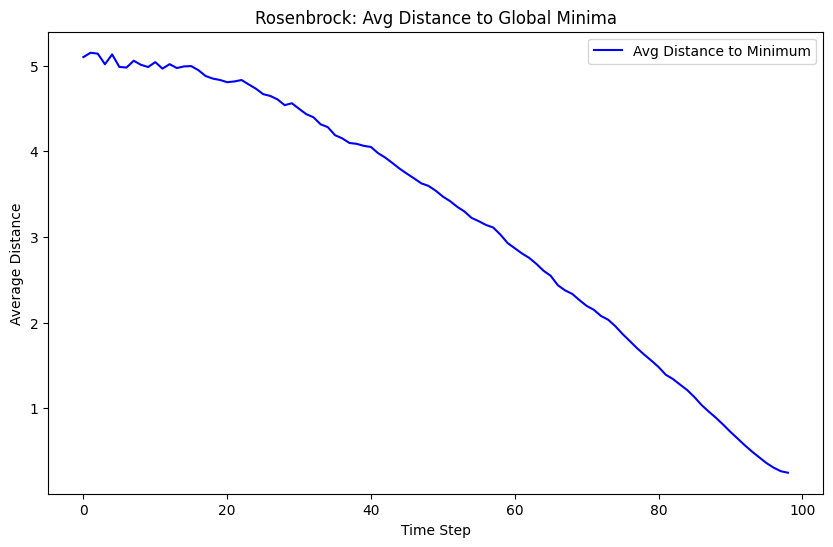

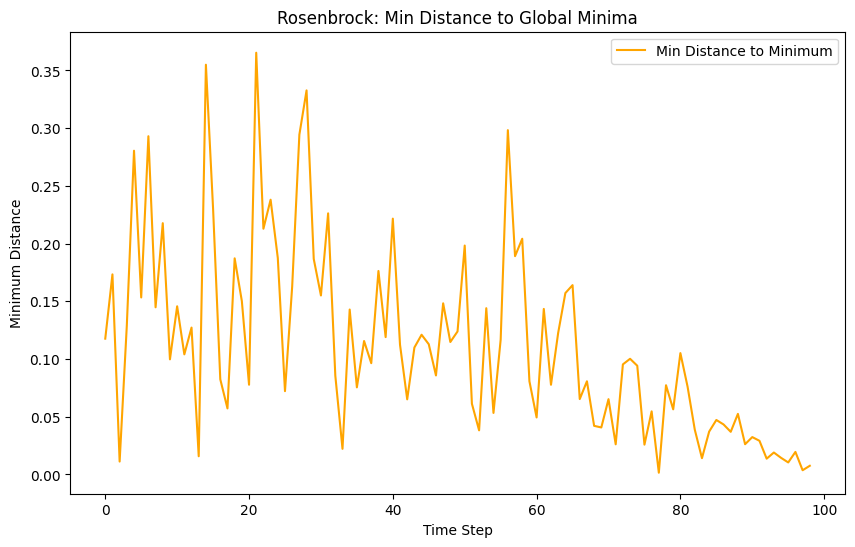

100%|██████████| 99/99 [00:03<00:00, 29.01it/s]


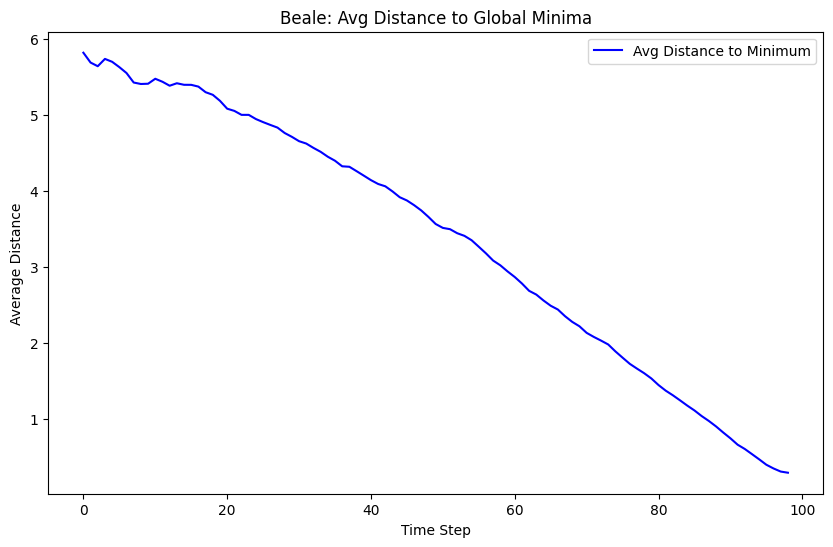

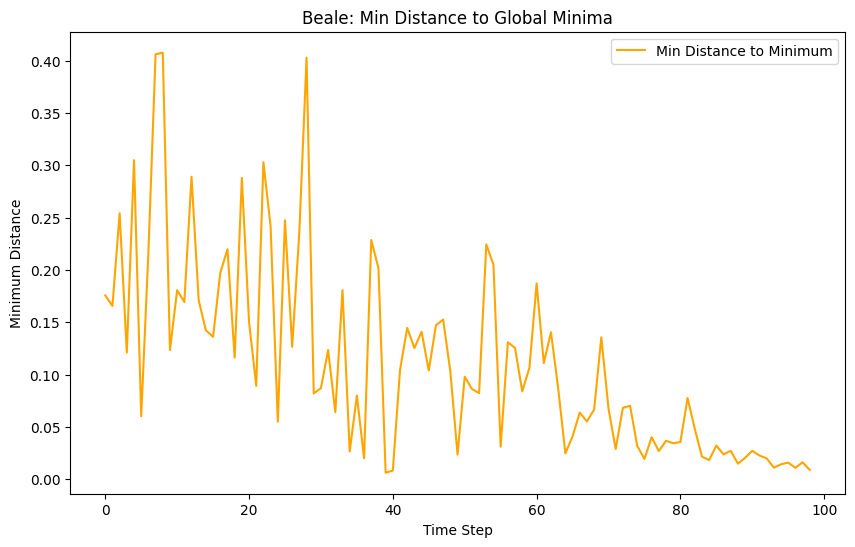

100%|██████████| 99/99 [00:05<00:00, 18.73it/s]


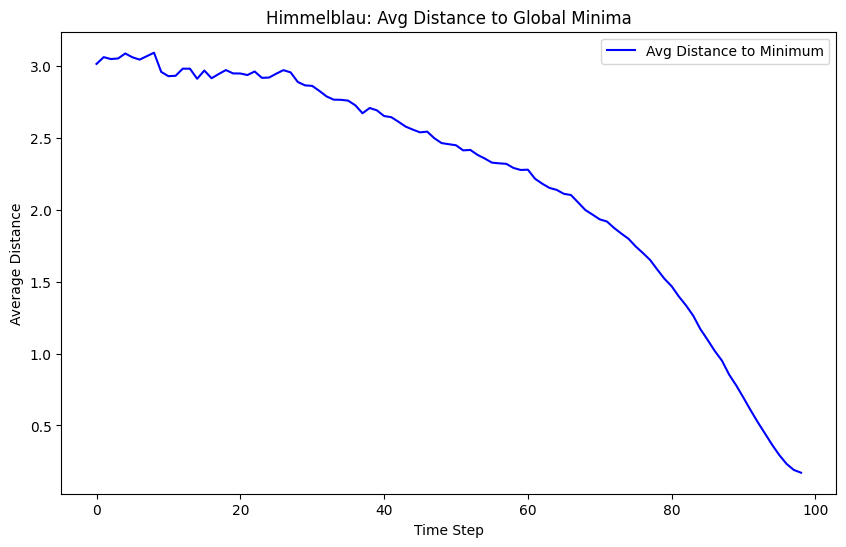

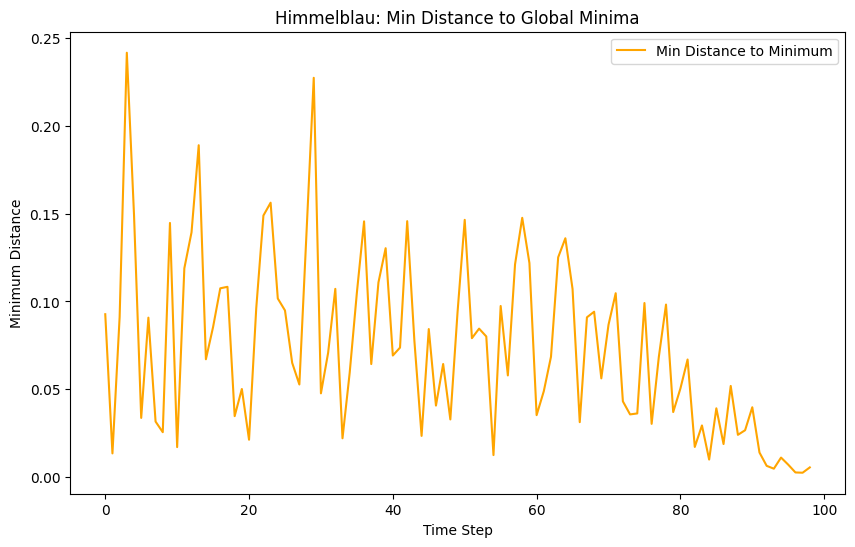

100%|██████████| 99/99 [00:04<00:00, 21.50it/s]


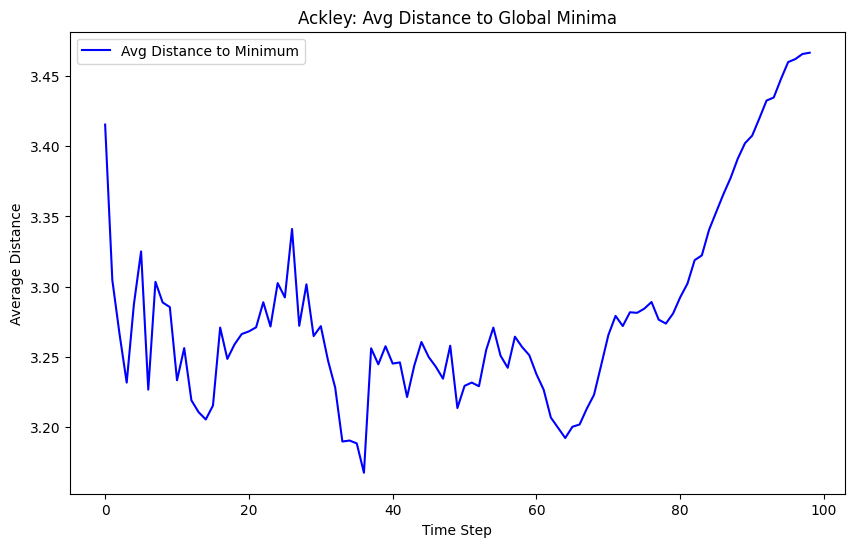

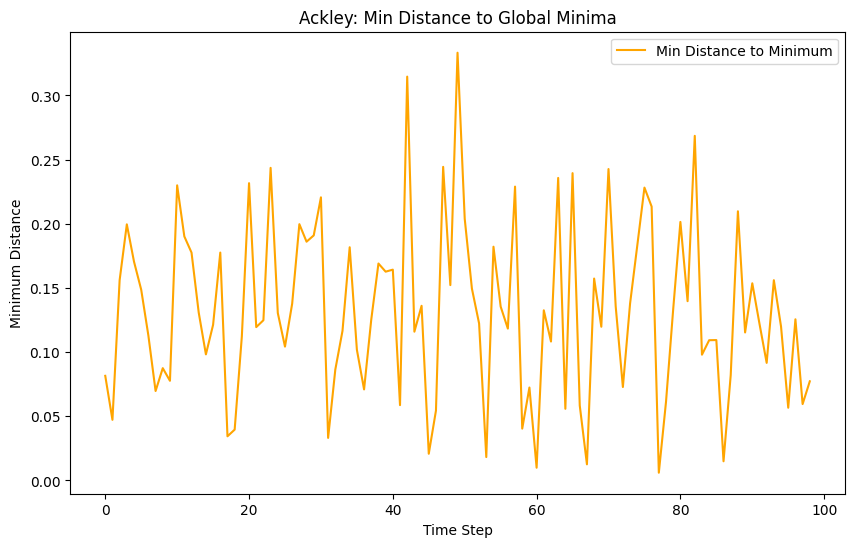

100%|██████████| 99/99 [00:04<00:00, 21.09it/s]


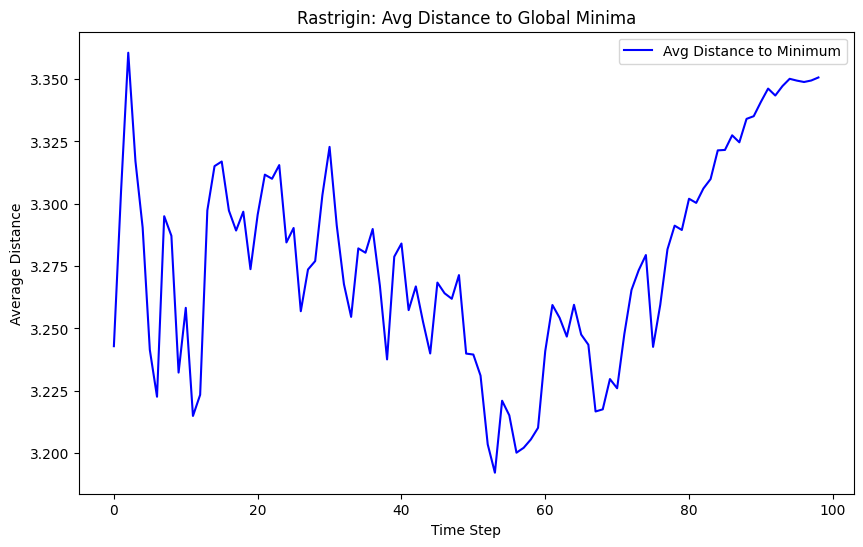

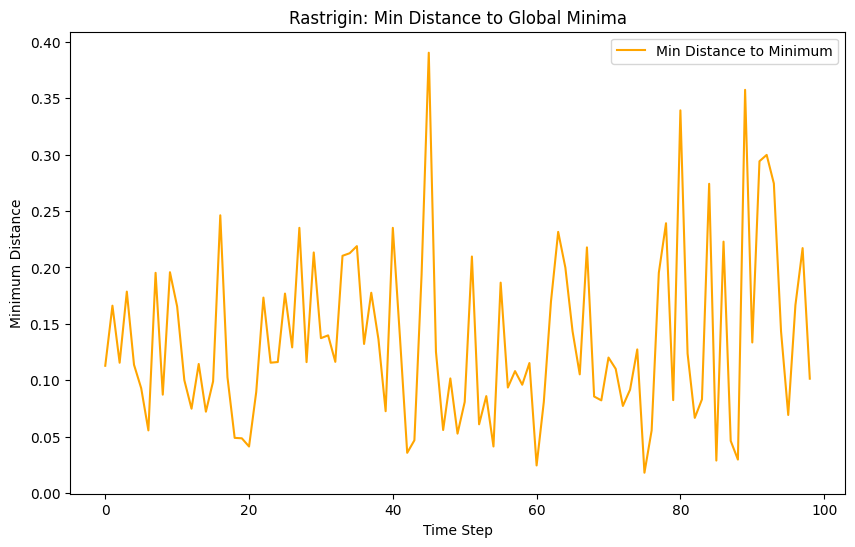

In [ ]:
def optimize_and_track_distance(func, f_star, s, global_minima, title):
    scheduler = Alpha_Schedule(num_step=100)
    scaling = 4.0
    noise = 1

    def wrapped_func(x):
        return transformed_fitness(func, x, f_star, s)

    x = torch.randn(1000, 2)
    avg_distances, min_distances = [], []

    for t, alpha in tqdm(scheduler, total=scheduler.num_step - 1):
        fitness = wrapped_func(x * scaling)
        x, _ = next_population(x, fitness, alpha, noise=noise)

        distances = torch.stack([torch.sqrt(((x * scaling - gm) ** 2).sum(dim=1)) for gm in global_minima])
        min_distances_per_particle = distances.min(dim=0).values
        avg_distance = min_distances_per_particle.mean().item()
        min_distance = min_distances_per_particle.min().item()

        avg_distances.append(avg_distance)
        min_distances.append(min_distance)

    plt.figure(figsize=(10, 6))
    plt.plot(avg_distances, label="Avg Distance to Minimum", color='blue')
    plt.xlabel("Time Step")
    plt.ylabel("Average Distance")
    plt.title(f"{title}: Avg Distance to Global Minima")
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.plot(min_distances, label="Min Distance to Minimum", color='orange')
    plt.xlabel("Time Step")
    plt.ylabel("Minimum Distance")
    plt.title(f"{title}: Min Distance to Global Minima")
    plt.legend()
    plt.show()

if __name__ == "__main__":
    global_minima = {
        "Rosenbrock": [torch.tensor([1.0, 1.0])],
        "Beale": [torch.tensor([3.0, 0.5])],
        "Himmelblau": [
            torch.tensor([3.0, 2.0]),
            torch.tensor([-2.805118, 3.131312]),
            torch.tensor([-3.779310, -3.283186]),
            torch.tensor([3.584428, -1.848126])
        ],
        "Ackley": [
            torch.tensor([4.0, 4.0]),
            torch.tensor([-4.0, 4.0]),
            torch.tensor([-4.0, -4.0]),
            torch.tensor([4.0, -4.0])
        ],
        "Rastrigin": [
            torch.tensor([4.0, 4.0]),
            torch.tensor([-4.0, 4.0]),
            torch.tensor([-4.0, -4.0]),
            torch.tensor([4.0, -4.0])
        ],
    }

    functions = [
        ("Rosenbrock", rosenbrock, 0, 1),
        ("Beale", beale, 0, 1),
        ("Himmelblau", himmelblau, 0, 1),
        ("Ackley", ackley, -12.5401, 2),
        ("Rastrigin", rastrigin, 64.6249, 30)
    ]

    for name, func, f_star, s in functions:
        global_min = global_minima[name]
        optimize_and_track_distance(func, f_star, s, global_min, title=name)


In [ ]:
import torch
import numpy as np
import plotly.graph_objects as go
from tqdm import tqdm


def rosenbrock(x):
    return torch.sum(100 * (x[:, 1:] - x[:, :-1]**2)**2 + (1 - x[:, :-1])**2, dim=1)

def ackley(x, a=20, b=0.2, c=2 * np.pi):
    term1 = -a * torch.exp(-b * torch.sqrt(torch.mean(x**2, dim=1)))
    term2 = -torch.exp(torch.mean(torch.cos(c * x), dim=1))
    return term1 + term2 + a + torch.exp(torch.tensor(1.0))

def rastrigin(x, A=10):
    return -(A * x.shape[1] + torch.sum(x**2 - A * torch.cos(2 * np.pi * x), dim=1))


def transformed_fitness(f, x, f_star, s, eps=1e-3):
    f_val = f(x)
    return eps / (eps + ((f_val - f_star)**2 / s**2))


def optimize_and_visualize_3d(func, f_star, s, title, dim=3):
    scheduler = Alpha_Schedule(num_step=20)
    scaling = 4.0
    noise = 0.1

    fig = go.Figure()

    def wrapped_func(x):
        return transformed_fitness(func, x, f_star, s)

    for i in range(10):
        x = torch.randn(216, dim)
        trace, x0_trace = [], []

        for t, alpha in tqdm(scheduler, total=scheduler.num_step - 1):
            fitness = wrapped_func(x * scaling)
            x, x0 = next_population(x, fitness, alpha, noise=noise)
            trace.append(x.clone() * scaling)
            x0_trace.append(x0.clone() * scaling)

        trace = torch.stack(trace)


        for gen_idx, step_trace in enumerate(trace):
            color_value = gen_idx / (len(trace) - 1)
            fig.add_trace(go.Scatter3d(
                x=step_trace[:, 0].numpy(),
                y=step_trace[:, 1].numpy(),
                z=step_trace[:, 2].numpy(),
                mode='markers',
                marker=dict(size=2, opacity=0.3, color=[color_value] * step_trace.shape[0], colorscale='gray', cmin=0, cmax=1),
                name=f"Generation {gen_idx + 1}",
            ))


    fig.update_layout(
        title=title,
        scene=dict(
            xaxis_title="x1",
            yaxis_title="x2",
            zaxis_title="x3",
            aspectmode="cube"
        ),
        coloraxis=dict(colorscale='gray', cmin=0, cmax=1),
        updatemenus=[dict(
            type="buttons",
            showactive=False,
            buttons=[dict(label="Show all Generations", method="relayout", args=[{"scene.camera": {"eye": {"x": 1.25, "y": 1.25, "z": 1.25}}}])],
        )],
    )


    fig.show()


if __name__ == "__main__":
    val_ack = ackley(torch.tensor([[4.0, 4.0, 4.0]]))
    val_rast = rastrigin(torch.tensor([[4.0, 4.0, 4.0]]))

    functions = [
        ("Rosenbrock", rosenbrock, 0, 1),
        ("Ackley", ackley, 12.5401, 1),
        ("Rastrigin", rastrigin, -64.6249, 1)
    ]

    for name, func, f_star, s in functions:
        optimize_and_visualize_3d(func, f_star, s, title=name, dim=3)


100%|██████████| 19/19 [00:00<00:00, 371.27it/s]


100%|██████████| 19/19 [00:00<00:00, 284.72it/s]


100%|██████████| 19/19 [00:00<00:00, 196.88it/s]


100%|██████████| 99/99 [00:05<00:00, 19.33it/s]


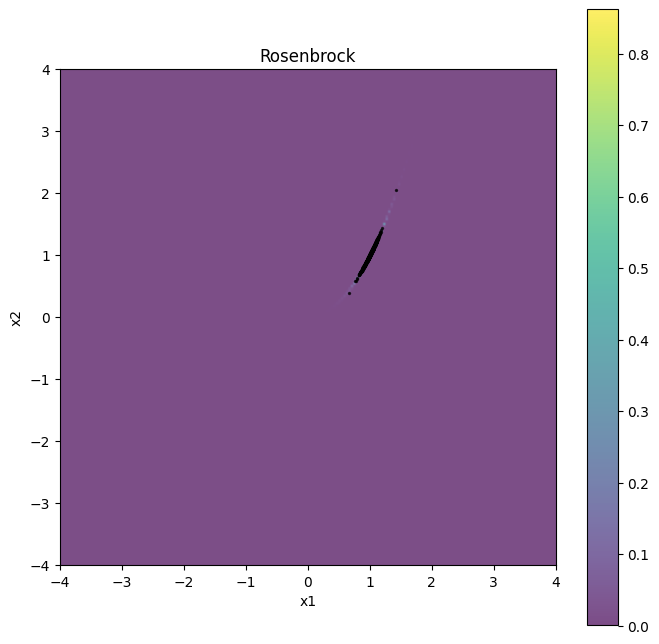

100%|██████████| 99/99 [00:03<00:00, 26.40it/s]


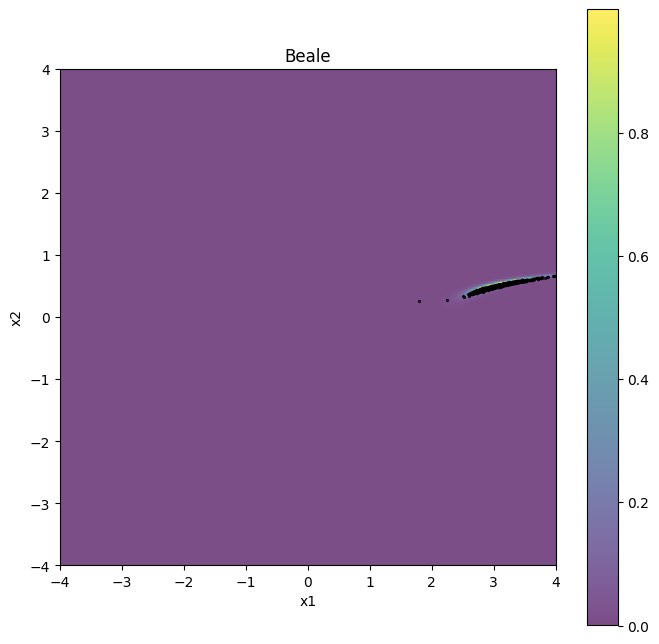

100%|██████████| 99/99 [00:03<00:00, 29.69it/s]


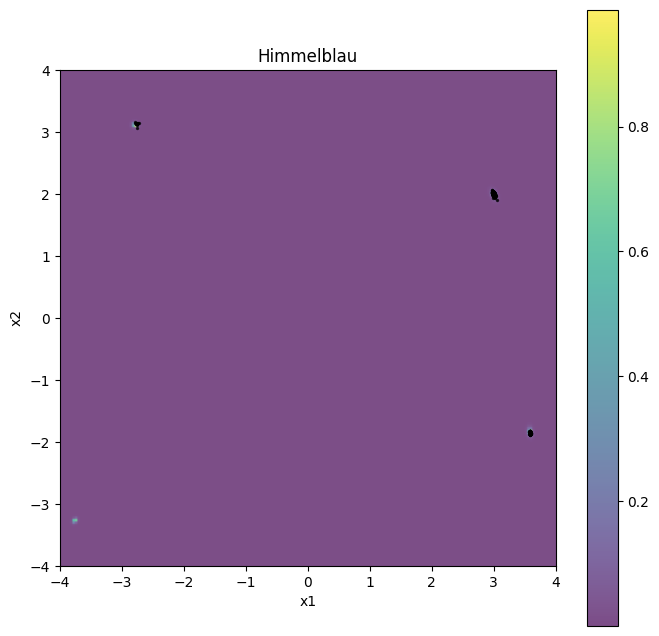

100%|██████████| 99/99 [00:03<00:00, 27.03it/s]


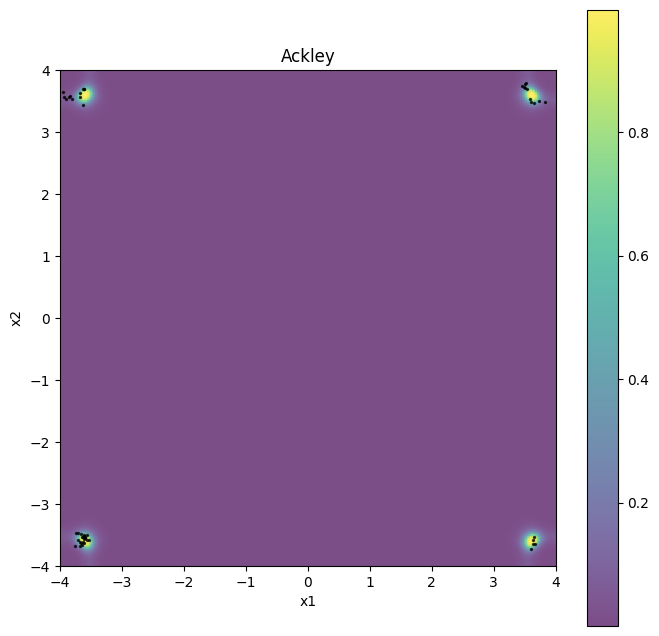

100%|██████████| 99/99 [00:03<00:00, 26.45it/s]


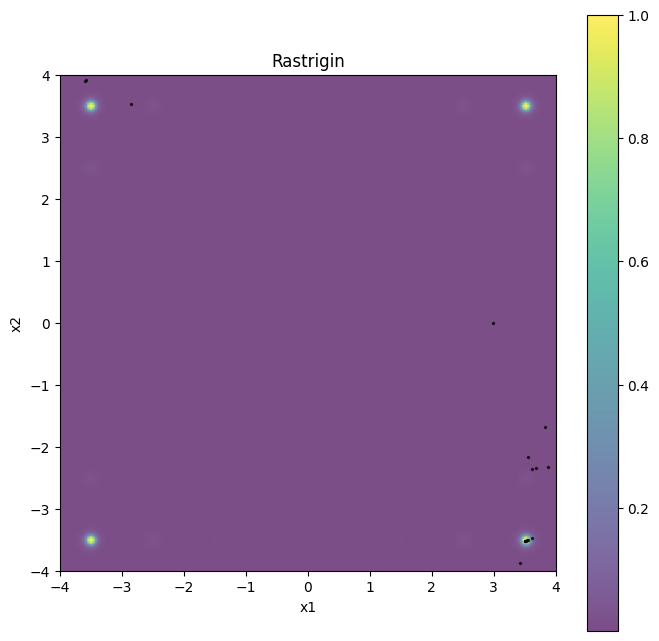

In [ ]:
def evaluate_function_on_grid(func, f_star, s, xlim=(-4, 4), ylim=(-4, 4), resolution=200):
    x_vals = np.linspace(xlim[0], xlim[1], resolution)
    y_vals = np.linspace(ylim[0], ylim[1], resolution)
    X, Y = np.meshgrid(x_vals, y_vals)
    Z = np.zeros_like(X)

    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            x = torch.tensor([[X[i, j], Y[i, j]]], dtype=torch.float32)
            Z[i, j] = transformed_fitness(func, x, f_star, s).item()

    return X, Y, Z

def plot_density_and_trajectory(func, trace, x0_trace, f_star, s, title, ax):
    X, Y, Z = evaluate_function_on_grid(func, f_star, s)

    im = ax.imshow(Z, extent=(-4, 4, -4, 4), origin="lower", cmap="viridis", alpha=0.7)
    ax.set_xlim(-4, 4)
    ax.set_ylim(-4, 4)

    traj_color = '#D55E00'
    x0_color = 'black'

    x0 = x0_trace[-1]
    ax.scatter(x0[:, 0], x0[:, 1], color=x0_color, marker='o', s=2, zorder=10, alpha=0.7)
    ax.set_title(title)
    ax.set_xlabel("x1")
    ax.set_ylabel("x2")

    plt.colorbar(im, ax=ax)

def optimize_and_visualize(func, f_star, s, title):
    scheduler = Alpha_Schedule(num_step=100)
    scaling = 4.0
    noise = 1

    def wrapped_func(x):
        return transformed_fitness(func, x, f_star, s)

    x = torch.randn(1000, 2)
    trace, x0_trace = [], []

    for t, alpha in tqdm(scheduler, total=scheduler.num_step - 1):
        fitness = wrapped_func(x * scaling)
        x, x0 = next_population(x, fitness, alpha, noise=noise)
        trace.append(x.clone() * scaling)
        x0_trace.append(x0.clone() * scaling)

    trace = torch.stack(trace)
    x0_trace = torch.stack(x0_trace)

    fig, ax = plt.subplots(figsize=(8, 8))
    plot_density_and_trajectory(func, trace, x0_trace, f_star, s, title, ax)
    plt.show()

if __name__ == "__main__":
    val_ack = ackley(torch.tensor([[4.0, 4.0]]))
    val_rast = rastrigin(torch.tensor([[4.0, 4.0]]))

    functions = [
        ("Rosenbrock", rosenbrock, 0, 1),
        ("Beale", beale, 0, 1),
        ("Himmelblau", himmelblau, 0, 1),
        ("Ackley", ackley, 12.5401, 2),
        ("Rastrigin", rastrigin, -64.6249, 30)
    ]

    for name, func, f_star, s in functions:
        optimize_and_visualize(func, f_star, s, title=name)


Wnioski i przemyślenia :

- Rzeczywiście dużym atutem tej metody są różnorodne populacje znajdujące **kilka ekstremów** jednocześnie.Z filozoficznego punktu widzenia warto myśleć o całym procesie ewolucji jak o diffusion-models czyli jak o przybliżaniu skomplikowanego rozkładu. Gdy dla rozważanej funkcji celu zdefiniujemy sobie rozkład przy użyciu funckji mapującej (najlepiej wyolbrzymiając różnice w jej wartościach np. jak to się dzieje w Power_mapping), będziemy w stanie przybliżać obszary o dużej gęstości, czyli znajdować optima.

- Mimo, że diffusion models używają sieci neuronowych do estymacji szumu (lub alternatywnie x_0), w naszym podejściu estymacja x_0 wyliczana jest na podstawie populacji.


- W przypadku rozkładów o wielu ciężkich modach (np. Gaussian-Mixture), otrzymywane w wyniku ewolucji populacje są różnorodne (pokrywają wiele, ale **nie wszytskie** z mód).

- Dla problemu two-peak density nawet nieiwelka liczba kroków dyfuzji (ok. 10) pozwala na uzyskanie satysfakcjonujących wyników i optymalna liczba kroków nie przekracza 100.


- Ogromne znaczanie dla szybkiej zbieżności procesu poszukiwania optimum ma **wybór funckji mapującej** funkcję celu na rozkład. W tym konkretnym podejściu zaproponowanym w artykule, funkcja mapująca wymaga znajomości wartości funkcji w ekstremum. Takie mapowanie bardzo pomaga w przypadku skomplikowanych przestzreni optymalizacji jak w przypadku Rastrigina i Ackleya, ale używa dodatkowej wiedzy. Dla prostszych przestrzeni poszukiwań np. dla two-peak mapowanie funckji celu na rozkład nie jest aż tak istotne, bo funkcja jest naprawdę łatwa, rozkład Gaussa ma stsounowo lekkie ogony (prawo 3 sigm). Mimo wszystko, możemy zaobserwować różnice między Power_mapping i Identity_mapping dla two-peak density.

- Warte prześledzenia i niestandadowe jest PRZBLIŻANIE x_0 za pomocą populacji, a nie modelowanie x_0 jako populację bezpośrednio (analogia z DDIM), dzięki temu sama populacja jest bardzo różnorodna, a estymacje x_0 są mniej różnorodne, ale bardziej dokładne.


- Poza tym, że wykresy ukazują nam przebieg procesu ewolucji, analizując otrzymywane populacji z czysto numerycznego punktu widzenia możemy dostrzec spadek średneij odległości osobników w populacji od optimum.


- [off-top] Odnośnie znajdowania wielu ekstremów jednozceśnie - czy to jest cel algorytmów ewolucyjnych? Chyba nie zawsze, wiele z tradycyjnych podejść używa wiedzy z mutowanej populacji do znajdowania jednego optymalnego rozwiązania. W sytuacji, gdy chcielibyśmy otrzymać ich wiele, możemy uruchomić nasz algorytm wielokrotnie z różnymi warunkami początkowymi pozwalającymi na zakończenie w innym meisjcu przestrzeni poszukiwań, więc czy podejście z artykułu ma jakieś praktyczne zastosowanie? Idk, ale jest ciekawe.

Warte zbadania w przyszłości:
- jakieś mądrzejsze mapowania funkcji celu na rozkłady, może nieużywające informacji o wartości w ekstremum?
- wpływ liczby kroków dyfuzji na wyniki
-rozważenie p(x_t) w mianowniku innego niż uniform (równanie 7 z artykułu)
-testy dla wielowymiarowych problemów/problemów innych niż benchmarki, np. te zastosowania w reinforcement learning
-zbadanie rozkładów innych niż gaussowskie, np. jakichś ciężkoogonowych - Tstudent, Cauchy, aby ważyć z większą siłą sąsiadów z brzegu promienia sąsiedztwa




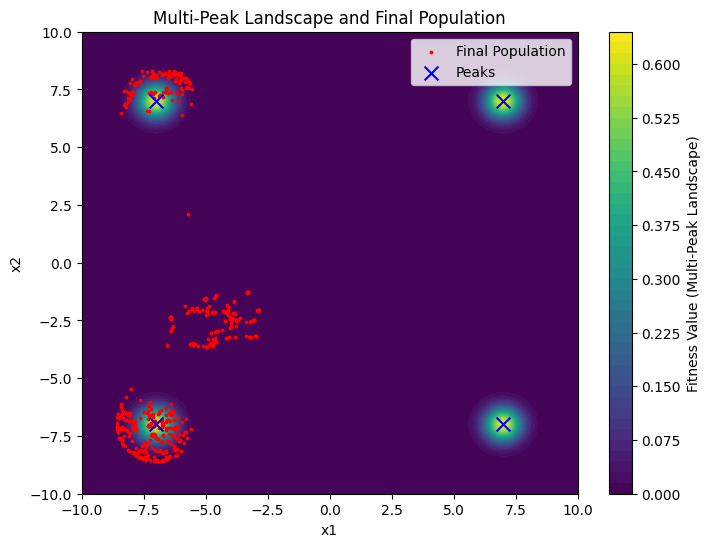

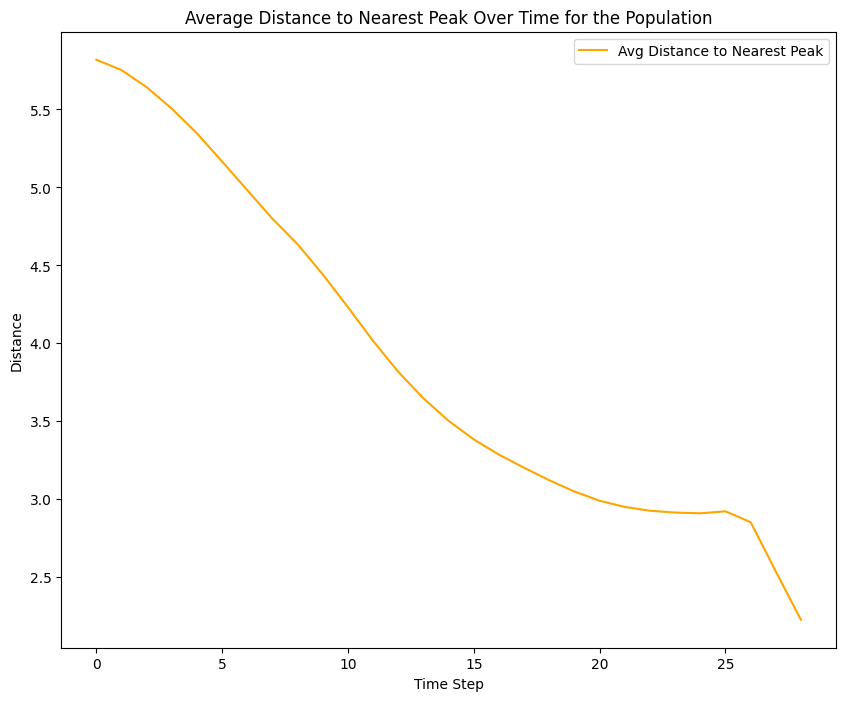

In [ ]:
std_dev = 0.5

def create_multi_peak_density(x, std_dev=std_dev):
    fitness_values = torch.zeros(x.shape[0])
    peak_positions = torch.tensor([[7.0, 7.0], [7.0, -7.0], [-7.0, 7.0], [-7.0, -7.0]])
    covariance_matrix = torch.eye(x.shape[1]) * (std_dev ** 2)

    for peak in peak_positions:
        distribution = MultivariateNormal(peak, covariance_matrix)
        density_values = distribution.log_prob(x).exp()
        fitness_values += density_values

    return fitness_values

def compute_distances(population, peak_positions):
    distances = torch.cdist(population, peak_positions)
    min_distances = distances.min(dim=1).values
    return min_distances

density_scheduler = Alpha_Schedule(num_step=30)

population = torch.randn(512, 2)*5
population_trace = []
fitness_mapping_fn = Power_mapping(3)

avg_distances_over_time = []

peak_positions = torch.tensor([[7.0, 7.0], [7.0, -7.0], [-7.0, 7.0], [-7.0, -7.0]])

for time_step, alpha_value in density_scheduler:
    fitness_values = create_multi_peak_density(population, std_dev=std_dev)
    mapped_fitness_values = fitness_mapping_fn(fitness_values)
    population, _ = next_population(population, mapped_fitness_values, alpha_value, noise=0.1)
    population_trace.append(population)

    min_distances = compute_distances(population, peak_positions)

    avg_distances_over_time.append(min_distances.mean().item())

population_trace = torch.stack(population_trace)


x_coords = np.linspace(-10, 10, 100)
y_coords = np.linspace(-10, 10, 100)

X_grid, Y_grid = np.meshgrid(x_coords, y_coords)
fitness_grid = np.zeros_like(X_grid)

for i in range(X_grid.shape[0]):
    for j in range(X_grid.shape[1]):
        fitness_grid[i, j] = create_multi_peak_density(torch.tensor([[X_grid[i, j], Y_grid[i, j]]]), std_dev=std_dev).item()

plt.figure(figsize=(8, 6))
plt.contourf(X_grid, Y_grid, fitness_grid, levels=50, cmap='viridis')
plt.colorbar(label="Fitness Value (Multi-Peak Landscape)")

final_population = population_trace[-1].numpy()
plt.scatter(final_population[:, 0], final_population[:, 1], color='r', label='Final Population', s=3)
plt.scatter(peak_positions[:, 0], peak_positions[:, 1], color='b', label='Peaks', s=100, marker='x')

plt.title('Multi-Peak Landscape and Final Population')
plt.xlabel('x1')
plt.ylabel('x2')
plt.legend()

plt.show()


plt.figure(figsize=(10, 8))
plt.plot(avg_distances_over_time, label='Avg Distance to Nearest Peak',  color='orange')

plt.xlabel('Time Step')
plt.ylabel('Distance')
plt.title('Average Distance to Nearest Peak Over Time for the Population')
plt.legend()
plt.show()
